In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import astropy
from matplotlib import pylab, cm
%matplotlib inline
import pylab
from numpy import array, pi,linspace
from astropy.io import fits
import math
from math import log
from astropy.table import Table
import pyfits
import warnings
warnings.filterwarnings("ignore")

In [4]:
hdul = fits.open('adjusted.fits')
data = hdul[1].data
flux_tot = data.field('Total_flux') # Obtain the total flux column 
z = data.field('z_best') # Obtain redshift column
Flux_22 = data.field('w4Flux') # Obtain 22 microns flux
Flux_g = data.field('gFApflux') # Obtain flux for g band
dc_major = data.field('DC_maj')
lgz = data.field('LGZ_size')
LGZ = array(lgz)
DC = array(dc_major)

In [41]:
#### NEW ELEMENTS
U = data.field('gFApMag')
u = array(U)
W1 = data.field('w1Mag')
W2 = data.field('w2Mag')
W3 = data.field('w3Mag')
W4 = data.field('w4Mag')

In [6]:
#Import package in order to get the function for Luminosity

from astropy.cosmology import FlatLambdaCDM
import astropy.units as u

cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
Lum_d = array(cosmo.luminosity_distance([flux_tot])*3.08567758e24)

def power(d,f,z):
    P = (4*pi*(d)**2*f*1e-26/(1+z))
    return P

Pw = power(Lum_d,flux_tot,z)
P_low_f = Pw*1e-7

In [42]:
## Vega Correction

W1_mag = array(W1-2.699)
W2_mag  = array(W2-3.339)
W3_mag = array(W3-5.174)
W4_mag = array(W4-6.620)

In [94]:
diff1 = array(W1_mag-W2_mag)
diff2 = array(W2_mag- W3_mag)
diff3 = array(W3_mag-W4_mag)
diff4 = array(U-W3)


In [178]:
x1 = (0.5*diff3)+0.979
x2 = (0.5*diff3)-0.105
x3 = (-2.00*diff3)+5.35

Tot_sources = np.vstack((P_low_f,z,diff1,diff2,diff3,diff4,x1,x2,x3,DC,LGZ)).T

#Limit1 = Tot_sources [(diff1 < x1)]
Limit1 = Tot_sources [(diff1 < x1)]
Limit3 = Tot_sources [(diff1 >= x3)]
Limit2 = Tot_sources[diff1> x2]

HERGs = Tot_sources[(diff1<x1)&(diff1>=x2)&(diff1>=x3)]

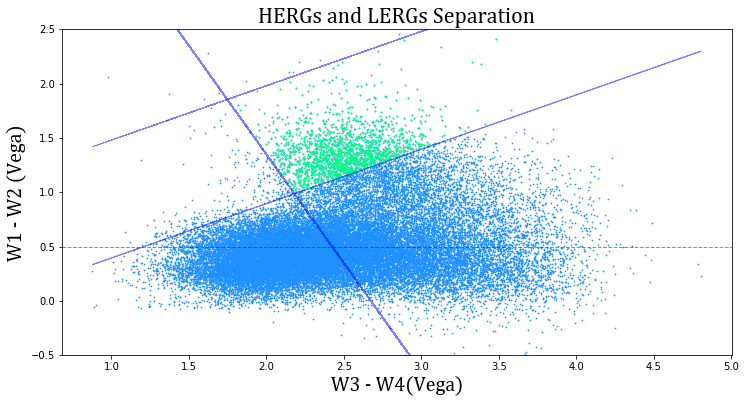

In [179]:
bsfont = {'fontname':'Cambria Math'}


f = plt.figure(figsize=(12,6))
plt.ylabel('W1 - W2 (Vega)', fontsize = 20,**bsfont)
plt.xlabel('W3 - W4(Vega)', fontsize=20,**bsfont)

plt.title('HERGs and LERGs Separation',fontsize=22,**bsfont)

plt.scatter(Tot_sources[:,4],Tot_sources[:,2],c='dodgerblue',s=0.5, label='LERGs')
plt.scatter(HERGs[:,4],HERGs[:,2],c='springgreen',s=0.5, label='LERGs')
plt.plot(Tot_sources[:,4],(0.5*Tot_sources[:,4]+0.979),c='blue',lw=0.5,alpha=0.5)
plt.plot(Tot_sources[:,4],(0.5*Tot_sources[:,4]-0.105),c='blue',lw=1,alpha=0.5)
plt.plot(Tot_sources[:,4],(-2.00*Tot_sources[:,4]+5.35),linestyle="--",c='blue',lw=1,alpha=0.5)
plt.axhline(y=0.5,lw=1,linestyle="--",c='blue',alpha=0.5)
plt.ylim(-0.5,2.5)

plt.show()

In [180]:
L_low_f = HERGs[:,0]
Z = HERGs[:,1]
W12 = HERGs[:,2]
W3u = HERGs[:,5]
maj = HERGs[:,9]
zoo = HERGs[:,10]

nHERGs = np.vstack((L_low_f,Z,W12,W3u,maj,zoo)).T

In [211]:
diff_14 = (W12*1.4)+3.2
diff_24 =(W12*1.4)+1.2

def QSO(x,d1,d14,d2,d3):
    qso = x[(d1 < d14) & (d2>0.7) &(d1>d3)]
    return array(qso)
QSO_tot = QSO(nHERGs,W3u,diff_14,W12,diff_24)

In [212]:
def RG(x,d1,d14):
    rg = x[(d1 >= d14)]
    return array(rg)
RG_tot = RG(nHERGs,W3u,diff_14)

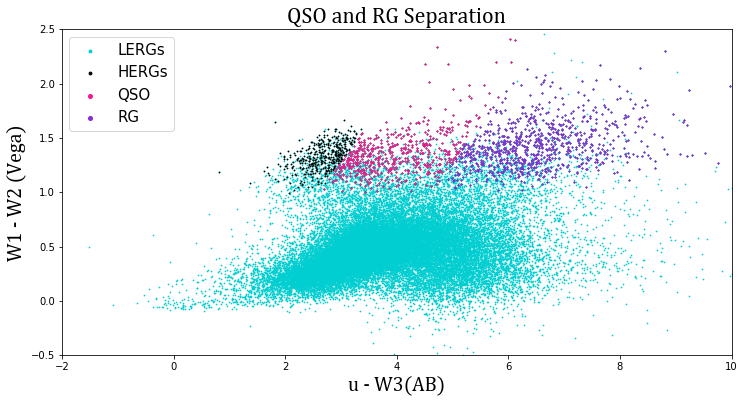

In [213]:
bsfont = {'fontname':'Cambria Math'}


f = plt.figure(figsize=(12,6))
plt.ylabel('W1 - W2 (Vega)', fontsize = 20,**bsfont)
plt.xlabel('u - W3(AB)', fontsize=20,**bsfont)

plt.title('QSO and RG Separation',fontsize=22,**bsfont)

plt.scatter(Tot_sources[:,5],Tot_sources[:,2],c='darkturquoise',s=0.5, label='LERGs')
plt.scatter(nHERGs[:,3],nHERGs[:,2],c='black',s=0.5, label='HERGs')
plt.scatter(QSO_tot[:,3],QSO_tot[:,2],c='deeppink',s=1.0,label = 'QSO')
plt.scatter(RG_tot[:,3],RG_tot[:,2],c='blueviolet',s=1.0, label = 'RG')
plt.xlim(-2,10)
plt.ylim(-0.5,2.5)
plt.legend(loc=2, prop={'size': 15},markerscale=4)
#plt.savefig('magnitude relation.png')
plt.show()

In [214]:
RG_tot.shape

(827, 6)

In [215]:
QSO_tot.shape

(564, 6)

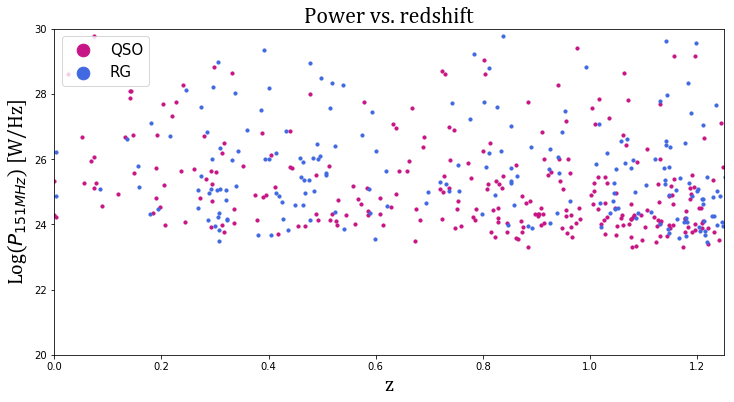

In [221]:
bsfont = {'fontname':'Cambria Math'}


f = plt.figure(figsize=(12,6))
plt.ylabel('Log($P_{151MHz}$) [W/Hz]', fontsize = 20,**bsfont)
plt.xlabel('z', fontsize=20,**bsfont)

plt.title('Power vs. redshift',fontsize=22,**bsfont)

plt.scatter(QSO_tot[:,1],np.log10(QSO_tot[:,0]),marker="o",c='mediumvioletred',s=10,label = 'QSO')
plt.scatter(RG_tot[:,1],np.log10(RG_tot[:,0]),marker="o",c='royalblue',s=10, label = 'RG')
plt.legend(loc=2, prop={'size': 15},markerscale=4)
plt.xlim(0,1.25)
plt.ylim(20,30)
plt.show()

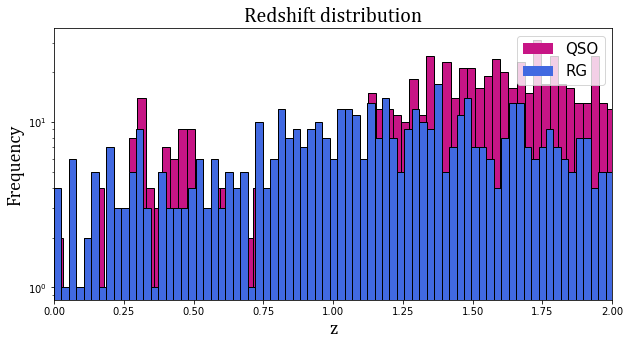

In [219]:
plt.figure(figsize=(10,5))
plt.hist(RG_tot[:,1], color= "mediumvioletred", bins = 200,label='QSO')
plt.hist(RG_tot[:,1], color= "royalblue", bins = 200, fill = False)
plt.hist(QSO_tot[:,1], color= "royalblue", bins = 200, label='RG')
plt.hist(QSO_tot[:,1], color= "royalblue", bins = 200, fill = False)
plt.title("Redshift distribution", fontsize = 20,**bsfont)
plt.yscale('log')
plt.xlabel("z", fontsize= 18,**bsfont)
plt.ylabel("Frequency", fontsize = 18,**bsfont)
rwidth=10
plt.legend(loc=1, prop={'size': 15})
plt.xlim(0,2)

fig = plt.gcf()

In [250]:
P_QSO = QSO_tot[:,0]
z_QSO = QSO_tot[:,1]
maj_QSO = np.nan_to_num(QSO_tot[:,4])
lgz_QSO = np.nan_to_num(QSO_tot[:,5])

P_RG = RG_tot[:,0]
z_RG = RG_tot[:,1]
maj_RG = np.nan_to_num(RG_tot[:,4]*2)
lgz_RG = np.nan_to_num(RG_tot[:,5])


In [251]:
for i in np.arange(len(maj_QSO)):
    if (lgz_QSO[i]==0):
        print (lgz_QSO)
    else:
        maj_QSO[i] = lgz_QSO[i]

[ 39.33596014   0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
  30.00041734   0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.          37.85388529   0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.          32.18845645   0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.         

In [252]:
for i in np.arange(len(maj_RG)):
    if (lgz_RG[i]==0):
        print (lgz_RG)
    else:
        maj_RG[i] = lgz_RG[i]

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.37794591e+02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.000000

In [254]:
def Box(x,z,mn,mx,P,Mn,Mx,n):
    cat = x[(z >= mn) & (z <= mx) & (P >= Mn) & (P <= Mx)]
    return array(cat[:,n])

In [255]:
qso = np.vstack((P_QSO,z_QSO,maj_QSO,lgz_QSO)).T
rg = np.vstack((P_RG,z_RG,maj_RG,lgz_RG)).T

In [256]:
ad_QSO = array(cosmo.angular_diameter_distance(QSO_tot[:,1])) #This is in Kiloparsecs
ad_RG = array(cosmo.angular_diameter_distance(RG_tot[:,1]))

def LZ(ang_d,dc):
    linear_size = ang_d*dc*(np.pi/180)
    return linear_size

#a = DC_MAJ[DC_MAJ != 0]
#b = DC_RG[DC_RG != 0]


L_QSO = array(LZ(ad_QSO,maj_QSO))
L_RG = array(LZ(ad_RG,maj_RG))

L_QSO.sort()
L_RG.sort()

L_qso = L_QSO[L_QSO != 0]
L_rg = L_RG[L_RG != 0]

In [257]:
P_rg = RG_tot[:,0]
z_rg = RG_tot[:,1]

P_qso = QSO_tot[:,0]
z_qso = QSO_tot[:,1]

Tot_rg = np.vstack((z_rg,P_rg,L_RG)).T
Tot_qso = np.vstack((z_qso,P_qso,L_QSO)).T

In [304]:
Box(Tot_rg,z_rg,1.75,2.0,P_rg,1e28,1e30,2).shape

(5,)

In [305]:
Box(Tot_qso,z_qso,1.75,2.0,P_qso,1e28,1e30,2).shape

(1,)

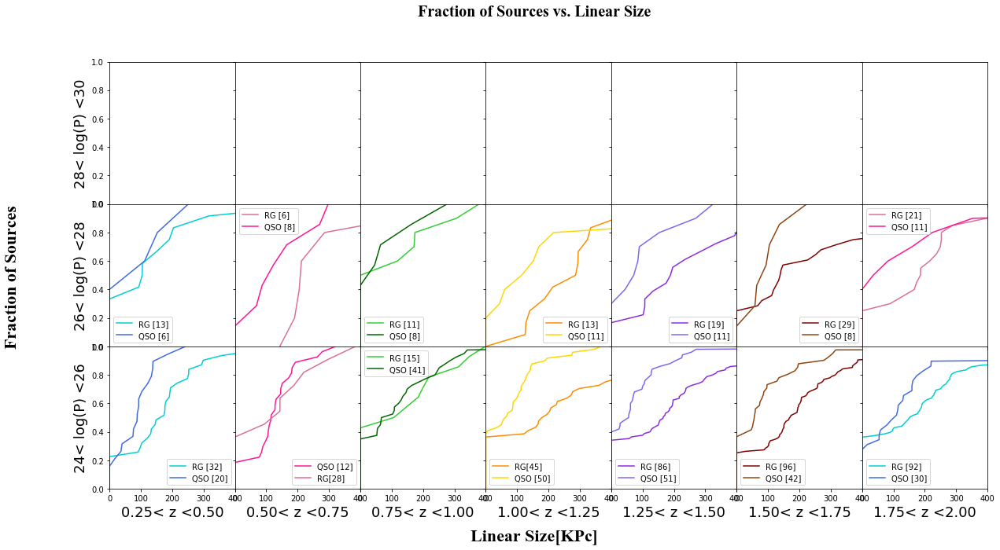

In [306]:
csfont = {'fontname':'Times New Roman'}

fig, axes  = plt.subplots(nrows=3, ncols=7, sharex=True, sharey=True,figsize = (20,10))
axes[2,0].plot(Box(Tot_rg,z_rg,0.25,0.50,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=32), c = 'darkturquoise', label = 'RG [32]')
axes[2,0].plot(Box(Tot_qso,z_qso,0.25,0.50,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=20), c='royalblue',label='QSO [20]')
axes[2,0].legend()
axes[2,0].set_xlabel('0.25< z <0.50',fontsize=18)
axes[2,0].set_ylabel('24< log(P) <26',fontsize=18)
axes[2,0].set_xlim(0,400)

axes[2,1].plot(Box(Tot_qso,z_qso,0.5,0.75,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=28), c='deeppink',label='QSO [12]')
axes[2,1].plot(Box(Tot_rg,z_rg,0.5,0.75,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=12), c = 'palevioletred', label = 'RG[28]')
axes[2,1].legend()
axes[2,1].set_xlabel('0.50< z <0.75',fontsize=18)

axes[2,2].plot(Box(Tot_rg,z_rg,0.75,1.0,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=15), c = 'limegreen', label = 'RG [15]')
axes[2,2].plot(Box(Tot_qso,z_qso,0.75,1.00,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=41), c='darkgreen',label='QSO [41]')
axes[2,2].legend()
axes[2,2].set_xlabel('0.75< z <1.00',fontsize=18)

axes[2,3].plot(Box(Tot_rg,z_rg,1.00,1.25,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=45), c = 'darkorange', label = 'RG[45]')
axes[2,3].plot(Box(Tot_qso,z_qso,1.00,1.25,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=50), c='gold',label='QSO [50]')
axes[2,3].legend()
axes[2,3].set_xlabel('1.00< z <1.25',fontsize=18)

axes[2,4].plot(Box(Tot_rg,z_rg,1.25,1.5,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=86), c = 'blueviolet', label = 'RG [86]')
axes[2,4].plot(Box(Tot_qso,z_qso,1.25,1.5,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=51), c='mediumslateblue',label='QSO [51]')
axes[2,4].legend()
axes[2,4].set_xlabel('1.25< z <1.50',fontsize=18)

axes[2,5].plot(Box(Tot_rg,z_rg,1.5,1.75,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=96), c = 'maroon', label = 'RG [96]')
axes[2,5].plot(Box(Tot_qso,z_qso,1.5,1.75,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=42), c='saddlebrown',label='QSO [42]')
axes[2,5].legend()
axes[2,5].set_xlabel('1.50< z <1.75',fontsize=18)

axes[2,6].plot(Box(Tot_rg,z_rg,1.75,2.00,P_rg,1e24,1e26,2),np.linspace(0,1.0,num=92), c = 'darkturquoise', label = 'RG [92]')
axes[2,6].plot(Box(Tot_qso,z_qso,1.75,2.00,P_qso,1e24,1e26,2),np.linspace(0,1.0,num=30), c='royalblue',label='QSO [30]')
axes[2,6].legend()
axes[2,6].set_xlabel('1.75< z <2.00',fontsize=18)

axes[1,0].plot(Box(Tot_rg,z_rg,0.25,0.50,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=13), c = 'darkturquoise', label = 'RG [13]')
axes[1,0].plot(Box(Tot_qso,z_qso,0.25,0.50,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=6), c='royalblue',label='QSO [6]')
axes[1,0].legend()
axes[1,0].set_ylabel('26< log(P) <28',fontsize=18)


axes[1,1].plot(Box(Tot_rg,z_rg,0.5,0.75,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=6), c = 'palevioletred', label = 'RG [6]')
axes[1,1].plot(Box(Tot_qso,z_qso,0.5,0.75,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=8), c='deeppink',label='QSO [8]')
axes[1,1].legend()

axes[1,2].plot(Box(Tot_rg,z_rg,0.75,1.0,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=11), c = 'limegreen', label = 'RG [11]')
axes[1,2].plot(Box(Tot_qso,z_qso,0.75,1.0,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=8), c='darkgreen',label='QSO [8]')
axes[1,2].legend()

axes[1,3].plot(Box(Tot_rg,z_rg,1.0,1.25,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=13), c = 'darkorange', label = 'RG [13]')
axes[1,3].plot(Box(Tot_qso,z_qso,1.0,1.25,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=11), c='gold',label='QSO [11]')
axes[1,3].legend()

axes[1,4].plot(Box(Tot_rg,z_rg,1.25,1.5,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=19), c = 'blueviolet', label = 'RG [19]')
axes[1,4].plot(Box(Tot_qso,z_qso,1.25,1.5,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=11), c='mediumslateblue',label='QSO [11]')
axes[1,4].legend(loc=4)

axes[1,5].plot(Box(Tot_rg,z_rg,1.5,1.75,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=29), c = 'maroon', label = 'RG [29]')
axes[1,5].plot(Box(Tot_qso,z_qso,1.5,1.75,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=8), c='saddlebrown',label='QSO [8]')
axes[1,5].legend()

axes[1,6].plot(Box(Tot_rg,z_rg,1.75,2.00,P_rg,1e26,1e28,2),np.linspace(0,1.0,num=21),c = 'palevioletred', label = 'RG [21]')
axes[1,6].plot(Box(Tot_qso,z_qso,1.75,2.00,P_qso,1e26,1e28,2),np.linspace(0,1.0,num=11), c='deeppink',label='QSO [11]')
axes[1,6].legend()


axes[0,0].set_ylabel('28< log(P) <30',fontsize=18)
plt.ylim(0,1)

plt.subplots_adjust(wspace=0,hspace=0)
fig.text(0.5, 0.04, 'Linear Size[KPc]', va='center', ha='center',fontsize=22,**csfont)
fig.text(0.04, 0.5, 'Fraction of Sources', va='center', ha='center', rotation='vertical',fontsize=22,**csfont)
plt.suptitle('Fraction of Sources vs. Linear Size', fontsize=20,**csfont)
plt.show()


In [313]:
print(np.median(Box(Tot_rg,z_rg,1.0,1.25,P_rg,1e24,1e26,1)),
     np.median(Box(Tot_qso,z_qso,1.25,1.5,P_qso,1e24,1e26,1)),
     np.median(Box(Tot_rg,z_rg,1.5,1.75,P_rg,1e24,1e26,1)),
     np.median(Box(Tot_rg,z_rg,1.00,1.25,P_rg,1e24,1e26,2))/np.median(Box(Tot_qso,z_qso,1.00,1.25,P_qso,1e24,1e26,2)),
     np.median(Box(Tot_rg,z_rg,1.25,1.50,P_rg,1e24,1e26,2))/np.median(Box(Tot_qso,z_qso,1.25,1.50,P_qso,1e24,1e26,2)),
     np.median(Box(Tot_rg,z_rg,1.5,1.75,P_rg,1e24,1e26,2))/np.median(Box(Tot_qso,z_qso,1.5,1.75,P_qso,1e24,1e26,2)),
     np.median(Box(Tot_rg,z_rg,1.75,2.0,P_rg,1e24,1e26,2))/np.median(Box(Tot_qso,z_qso,1.75,2.00,P_qso,1e24,1e26,2)))

7.224251168522357e+24 4.7537944328927086e+24 4.845943894101532e+24 2.878468990317408 2.9777484519131985 3.0151726543410984 1.493643467031374


In [314]:
print(np.median(Box(Tot_rg,z_rg,1.0,1.25,P_rg,1e26,1e28,1)),
     np.median(Box(Tot_rg,z_rg,1.25,1.50,P_rg,1e26,1e28,1)),
     np.median(Box(Tot_rg,z_rg,0.75,1.00,P_rg,1e26,1e28,2))/np.median(Box(Tot_qso,z_qso,0.75,1.00,P_qso,1e26,1e28,2)),
     np.median(Box(Tot_rg,z_rg,1.00,1.25,P_rg,1e26,1e28,2))/np.median(Box(Tot_qso,z_qso,1.00,1.25,P_qso,1e26,1e28,2)),
     np.median(Box(Tot_rg,z_rg,1.25,1.50,P_rg,1e26,1e28,2))/np.median(Box(Tot_qso,z_qso,1.25,1.50,P_qso,1e26,1e28,2)),
     np.median(Box(Tot_rg,z_rg,1.5,1.75,P_rg,1e26,1e28,2))/np.median(Box(Tot_qso,z_qso,1.5,1.75,P_qso,1e26,1e28,2)),
     np.median(Box(Tot_rg,z_rg,1.75,2.0,P_rg,1e26,1e28,2))/np.median(Box(Tot_qso,z_qso,1.75,2.00,P_qso,1e26,1e28,2)))

4.153980711418245e+26 3.7449066187985214e+26 0.0 2.500665063039501 2.6263830556309724 1.755178650966271 5.252988805436208


In [332]:
L24 = array([2.878468990317408,2.9777484519131985,3.0151726543410984])
L26  = array([2.500665063039501,2.6263830556309724])

z26 = array([1.1427,1.3819999694824219])
z24= array([1.147,1.3930774927139282,1.5291])

p24 = array([7.224251168522357e+24,4.7537944328927086e+25,4.845943894101532e+25])
p26 = array([4.153980711418245e+26,3.7449066187985214e+27])

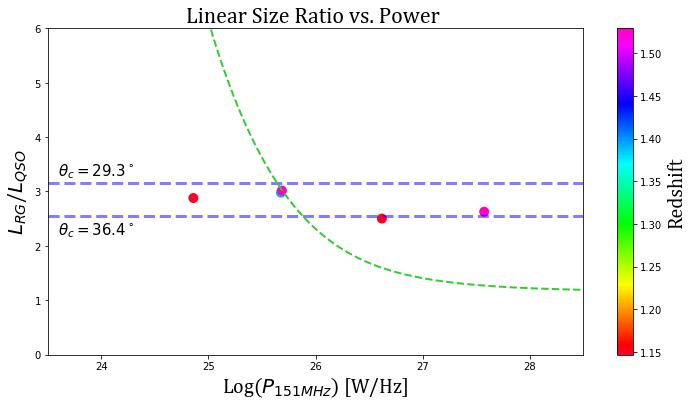

In [333]:
bsfont = {'fontname':'Cambria Math'}

ranges1  = np.linspace(5e25, 1e28, num=21)
rangesz = np.linspace(0.25, 2.00, num=7)

f = plt.figure(figsize=(12,6))
plt.ylabel('$L_{RG}$/$L_{QSO}$', fontsize = 20,**bsfont)
plt.xlabel('Log($P_{151MHz}$) [W/Hz]', fontsize=20,**bsfont)

plt.title('Linear Size Ratio vs. Power ',fontsize=22,**bsfont)
#plt.errorbar(np.log10(np.linspace(1e28, 1e29, num=7)),P28_30,yerr=e_bin3,c = 'royalblue',fmt='o',alpha=0.7)
#plt.errorbar(np.log10(np.linspace(1e26, 1e28, num=7)),P26_28,yerr=e_bin2,xerr=e_P_bin3,c = 'royalblue',fmt='o',alpha=0.7)
#plt.errorbar(np.log10(np.linspace(1e24, 1e26, num=7)),P24_26,yerr=e_bin1,xerr=e_P_bin3,c = 'royalblue',fmt='o',alpha=0.7)

val = plt.scatter(np.log10(p24),L24,c=z24,s=100,cmap='gist_rainbow',lw=0)
plt.scatter(np.log10(p26),L26,c=z26,s=100,cmap='gist_rainbow',lw=0)
cbar = plt.colorbar(val)
cbar.ax.set_ylabel('Redshift',fontsize=20,**bsfont)
plt.text(23.6,3.3, r'$\theta_c=29.3^\circ$',fontsize = 15,**bsfont)
plt.text(23.6,2.2, r'$\theta_c=36.4^\circ$',fontsize = 15,**bsfont)
plt.axhline(y= 3.1480,lw=3,linestyle="--",c='blue',alpha=0.5)
plt.axhline(y= 2.555,lw=3,linestyle="--",c='blue',alpha=0.5)
plt.plot(np.log10(L_low_f),receding_ratio,lw=2,linestyle="--",c='limegreen')
plt.xlim(23.5,28.5)
plt.ylim(0,6)
plt.savefig('L vs. P:method2.png')
plt.show()

In [320]:
L_0 = 1.5e26

def q_frac(L,theta):
    fraction = 1-((1+(L/L_0)*(np.tan(theta)**2)))**(-0.5)
    return fraction

In [326]:
frac = q_frac(L_low_f,np.radians(38.43))
theta_pred = np.arccos(1-frac)
fs_rg = np.arccos(np.cos(theta_pred)/2)
fs_qso = np.arccos((1+np.cos(theta_pred))/2)
receding_ratio = np.sin(fs_rg)/np.sin(fs_qso)
L_low_f.sort()

(24, 28)

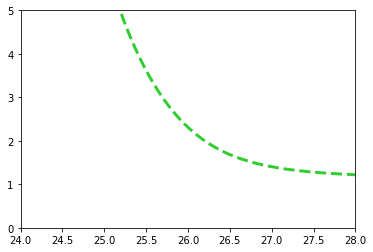

In [327]:

plt.plot(np.log10(L_low_f),receding_ratio,lw=3,linestyle="--",c='limegreen')
plt.plot(np.log10(L_low_f),np.log10(1/(L_low_f)**2),lw=2,linestyle="--",c='black')
plt.ylim(0,5)
plt.xlim(24,28)